# Optimizacion de hiperparametros

In [1]:
import pandas as pd
import polars as pl
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import ShuffleSplit, StratifiedShuffleSplit
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import SimpleImputer

import lightgbm as lgb

import optuna
from optuna.visualization import plot_optimization_history, plot_param_importances, plot_slice, plot_contour

from time import time

import pickle

Matplotlib is building the font cache; this may take a moment.


/home/eanegrin/.venv/lib/python3.12/site-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)
/home/eanegrin/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
!gsutil cp /home/eanegrin/buckets/b1/datasets/competencia_03_fe_v03_undersampled.parquet /home/eanegrin/datasets/

Copying file:///home/eanegrin/buckets/b1/datasets/competencia_03_fe_v02_undersampled_10_altbinaria.parquet...
- [1 files][588.9 MiB/588.9 MiB]                                                
Operation completed over 1 objects/588.9 MiB.                                    


In [ ]:
# base_path = 'C:/Eugenio/Maestria/DMEyF/'
base_path = '/home/eanegrin/buckets/b1/'

dataset_path = base_path + 'datasets/'
modelos_path = base_path + 'modelos/'
db_path = base_path + 'db/'
dataset_file = 'competencia_03_fe_v03_undersampled.parquet'

ganancia_acierto = 273000
costo_estimulo = 7000

semillas = [122219, 109279, 400391, 401537, 999961]

data = pd.read_parquet('/home/eanegrin/datasets/' + dataset_file)
# data = pd.read_parquet(dataset_path + dataset_file)

In [ ]:
# el dataset undersampleado ya excluye los meses "malos" y los que tienen la clase ternaria incompleta
# nos queda excluir el mes de testing:

data = data[data['foto_mes'] != 202107]

data['foto_mes'].unique()

(407286, 682)

In [ ]:
data.shape

array([201905, 201906, 201907, 201908, 201909, 201910, 201911, 201912,
       202001, 202002, 202003, 202004, 202005, 202006, 202007, 202008,
       202009, 202010, 202011, 202012, 202101, 202102, 202103, 202104,
       202105, 202106])

In [7]:
# Asignamos pesos a las clases

data['clase_peso'] = 1.0

data.loc[data['clase_ternaria'] == 'BAJA+2', 'clase_peso'] = 1.00002
data.loc[data['clase_ternaria'] == 'BAJA+1', 'clase_peso'] = 1.00001

In [8]:
X_train = data.drop(['clase_ternaria', 'clase_peso', 'clase_binaria'], axis=1)
y_train_binaria = data['clase_binaria'] # Junta a los 2 baja
w_train = data['clase_peso']

Para evaluar la calidad del modelo, crearemos nuestra propia función de evaluación que calcule la ganancia. La razón de incluir los pesos es precisamente para poder implementar esta función de evaluación de manera adecuada. Al combinar las clases *BAJA+1* y *BAJA+2* en una sola, necesitamos una forma de diferenciarlas, y es aquí donde entra en juego el *weight*. Este parámetro nos permitirá distinguir entre ambas clases al momento de evaluarlas dentro del algoritmo.


In [9]:
def lgb_gan_eval(y_pred, data):
    weight = data.get_weight()
    ganancia = np.where(weight == 1.00002, ganancia_acierto, 0) - np.where(weight < 1.00002, costo_estimulo, 0)
    ganancia = ganancia[np.argsort(y_pred)[::-1]]
    ganancia = np.cumsum(ganancia)

    return 'gan_eval', np.max(ganancia) , True

# Optimizacion

In [ ]:
def objective(trial):

    num_leaves = trial.suggest_int('num_leaves', 8, 150),
    learning_rate = trial.suggest_float('learning_rate', 0.005, 0.05),
    min_data_in_leaf = trial.suggest_int('min_data_in_leaf', 1, 2000),
    feature_fraction = trial.suggest_float('feature_fraction', 0.1, 1.0),
    bagging_fraction = trial.suggest_float('bagging_fraction', 0.1, 1.0),

    params = {
        'objective': 'binary',
        'metric': 'custom',
        'boosting_type': 'gbdt',
        'first_metric_only': True,
        'boost_from_average': True,
        'feature_pre_filter': False,
        'max_bin': 31,
        'num_leaves': num_leaves,
        'learning_rate': learning_rate,
        'min_data_in_leaf': min_data_in_leaf,
        'feature_fraction': feature_fraction,
        'bagging_fraction': bagging_fraction,
        'seed': semillas[0],
        'verbose': -1
    }
    
    train_data = lgb.Dataset(X_train,
                              label=y_train_binaria,
                              weight=w_train)
    
    # print(f"Learning Rate: {learning_rate}, Type: {type(learning_rate)}")
    
    # callbacks for early stopping
    early_stopping_cb = lgb.early_stopping(stopping_rounds=50)
        
    cv_results = lgb.cv(
        params,
        train_data,
        num_boost_round=1000,
        callbacks=[early_stopping_cb],
        feval=lgb_gan_eval,
        stratified=True,
        nfold=5,
        seed=semillas[0]
    )
    
    max_gan = max(cv_results['valid gan_eval-mean'])
    best_iter = cv_results['valid gan_eval-mean'].index(max_gan) + 1

    # Guardamos cual es la mejor iteración del modelo
    trial.set_user_attr("best_iter", best_iter)

    return max_gan * 5 # funcion objetivo, en el proximo paso le digo si quiero maximizarla o minimizarla.

In [ ]:
storage_name = "sqlite:///" + db_path + "optimization_lgbm.db"
study_name = "competencia3_lgbm_v03" # UPDATE

study = optuna.create_study(
    direction="maximize",
    study_name=study_name,
    storage=storage_name,
    load_if_exists=True,
)

[I 2024-11-29 12:14:35,212] A new study created in RDB with name: competencia3_lgbm_v02


In [12]:
study.optimize(objective, n_trials=100)

Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[749]	cv_agg's valid gan_eval: 7.40733e+08 + 4.10986e+06


[I 2024-11-29 12:29:48,353] Trial 0 finished with value: 3703665000.0 and parameters: {'num_leaves': 57, 'learning_rate': 0.01684683980963075, 'min_data_in_leaf': 471, 'feature_fraction': 0.40057158587033914, 'bagging_fraction': 0.6515266959109617}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[637]	cv_agg's valid gan_eval: 7.37747e+08 + 4.02643e+06


[I 2024-11-29 12:32:35,030] Trial 1 finished with value: 3688734000.0 and parameters: {'num_leaves': 21, 'learning_rate': 0.029466426782074784, 'min_data_in_leaf': 710, 'feature_fraction': 0.9693954222615115, 'bagging_fraction': 0.9791343551191666}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[782]	cv_agg's valid gan_eval: 7.38584e+08 + 3.63798e+06


[I 2024-11-29 12:38:02,718] Trial 2 finished with value: 3692920000.0 and parameters: {'num_leaves': 12, 'learning_rate': 0.0436907137516157, 'min_data_in_leaf': 583, 'feature_fraction': 0.3907446164187569, 'bagging_fraction': 0.12054333400917472}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[482]	cv_agg's valid gan_eval: 7.38322e+08 + 4.79599e+06


[I 2024-11-29 12:41:39,101] Trial 3 finished with value: 3691611000.0 and parameters: {'num_leaves': 27, 'learning_rate': 0.0495335280561825, 'min_data_in_leaf': 1795, 'feature_fraction': 0.30350950248751507, 'bagging_fraction': 0.7296780101694935}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[687]	cv_agg's valid gan_eval: 7.404e+08 + 5.41125e+06


[I 2024-11-29 12:46:07,951] Trial 4 finished with value: 3701999000.0 and parameters: {'num_leaves': 67, 'learning_rate': 0.01631704988676707, 'min_data_in_leaf': 1271, 'feature_fraction': 0.9333863438658703, 'bagging_fraction': 0.15669013568398574}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[384]	cv_agg's valid gan_eval: 7.38622e+08 + 4.47498e+06


[I 2024-11-29 12:48:56,846] Trial 5 finished with value: 3693109000.0 and parameters: {'num_leaves': 101, 'learning_rate': 0.03738287171209676, 'min_data_in_leaf': 1229, 'feature_fraction': 0.13736421047424102, 'bagging_fraction': 0.5907610003769385}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[364]	cv_agg's valid gan_eval: 7.4023e+08 + 4.72241e+06


[I 2024-11-29 12:51:58,103] Trial 6 finished with value: 3701152000.0 and parameters: {'num_leaves': 85, 'learning_rate': 0.02740594070195302, 'min_data_in_leaf': 1591, 'feature_fraction': 0.7699953444643944, 'bagging_fraction': 0.17991418524030756}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[399]	cv_agg's valid gan_eval: 7.40699e+08 + 4.9805e+06


[I 2024-11-29 12:55:03,557] Trial 7 finished with value: 3703497000.0 and parameters: {'num_leaves': 74, 'learning_rate': 0.028063957459146482, 'min_data_in_leaf': 1895, 'feature_fraction': 0.7750478285192995, 'bagging_fraction': 0.5284816319646106}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[264]	cv_agg's valid gan_eval: 7.37541e+08 + 4.03272e+06


[I 2024-11-29 12:58:24,764] Trial 8 finished with value: 3687705000.0 and parameters: {'num_leaves': 111, 'learning_rate': 0.03590175233517471, 'min_data_in_leaf': 85, 'feature_fraction': 0.539680370154877, 'bagging_fraction': 0.19431511381509103}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[296]	cv_agg's valid gan_eval: 7.39424e+08 + 4.30424e+06


[I 2024-11-29 13:01:21,005] Trial 9 finished with value: 3697120000.0 and parameters: {'num_leaves': 112, 'learning_rate': 0.02595392515866245, 'min_data_in_leaf': 608, 'feature_fraction': 0.27365823022449187, 'bagging_fraction': 0.8914517579097884}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[916]	cv_agg's valid gan_eval: 7.3703e+08 + 3.9643e+06


[I 2024-11-29 13:09:57,985] Trial 10 finished with value: 3685150000.0 and parameters: {'num_leaves': 147, 'learning_rate': 0.0077172573949242235, 'min_data_in_leaf': 95, 'feature_fraction': 0.5939653211632725, 'bagging_fraction': 0.39529478222633274}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[704]	cv_agg's valid gan_eval: 7.40083e+08 + 4.67034e+06


[I 2024-11-29 13:14:19,752] Trial 11 finished with value: 3700417000.0 and parameters: {'num_leaves': 52, 'learning_rate': 0.016678454891003353, 'min_data_in_leaf': 906, 'feature_fraction': 0.69122149306956, 'bagging_fraction': 0.484158751756926}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[760]	cv_agg's valid gan_eval: 7.40156e+08 + 4.62711e+06


[I 2024-11-29 13:20:59,678] Trial 12 finished with value: 3700781000.0 and parameters: {'num_leaves': 48, 'learning_rate': 0.018055737502381652, 'min_data_in_leaf': 1945, 'feature_fraction': 0.47016115438070966, 'bagging_fraction': 0.6841666276271423}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[746]	cv_agg's valid gan_eval: 7.38913e+08 + 4.76448e+06


[I 2024-11-29 13:25:41,943] Trial 13 finished with value: 3694565000.0 and parameters: {'num_leaves': 73, 'learning_rate': 0.011233072179685406, 'min_data_in_leaf': 302, 'feature_fraction': 0.800691653216036, 'bagging_fraction': 0.42281884482369736}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[556]	cv_agg's valid gan_eval: 7.39136e+08 + 4.64682e+06


[I 2024-11-29 13:29:02,116] Trial 14 finished with value: 3695678000.0 and parameters: {'num_leaves': 41, 'learning_rate': 0.021940687398902654, 'min_data_in_leaf': 1444, 'feature_fraction': 0.6444520948762202, 'bagging_fraction': 0.7376976462550856}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[330]	cv_agg's valid gan_eval: 7.39488e+08 + 4.71119e+06


[I 2024-11-29 13:31:27,656] Trial 15 finished with value: 3697442000.0 and parameters: {'num_leaves': 60, 'learning_rate': 0.03293579655499134, 'min_data_in_leaf': 1008, 'feature_fraction': 0.8514477147270985, 'bagging_fraction': 0.5877049539594291}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[992]	cv_agg's valid gan_eval: 7.40151e+08 + 4.26226e+06


[I 2024-11-29 13:39:59,447] Trial 16 finished with value: 3700753000.0 and parameters: {'num_leaves': 85, 'learning_rate': 0.011757533025088817, 'min_data_in_leaf': 408, 'feature_fraction': 0.4552337261428806, 'bagging_fraction': 0.2828483668089988}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[516]	cv_agg's valid gan_eval: 7.40092e+08 + 4.4224e+06


[I 2024-11-29 13:44:06,770] Trial 17 finished with value: 3700459000.0 and parameters: {'num_leaves': 135, 'learning_rate': 0.023093696803028106, 'min_data_in_leaf': 904, 'feature_fraction': 0.19444085903895342, 'bagging_fraction': 0.8125331177421735}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[757]	cv_agg's valid gan_eval: 7.39316e+08 + 4.24383e+06


[I 2024-11-29 13:48:18,317] Trial 18 finished with value: 3696581000.0 and parameters: {'num_leaves': 37, 'learning_rate': 0.020781383710251265, 'min_data_in_leaf': 1647, 'feature_fraction': 0.7222349931252602, 'bagging_fraction': 0.3213155102545483}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[995]	cv_agg's valid gan_eval: 7.35745e+08 + 4.22649e+06


[I 2024-11-29 13:56:19,015] Trial 19 finished with value: 3678724000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.005106472173249568, 'min_data_in_leaf': 1168, 'feature_fraction': 0.35698707566818205, 'bagging_fraction': 0.5198920196413921}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[277]	cv_agg's valid gan_eval: 7.37937e+08 + 5.04361e+06


[I 2024-11-29 13:59:32,628] Trial 20 finished with value: 3689686000.0 and parameters: {'num_leaves': 61, 'learning_rate': 0.031534011649571245, 'min_data_in_leaf': 315, 'feature_fraction': 0.5384632395481399, 'bagging_fraction': 0.6191853146470281}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[589]	cv_agg's valid gan_eval: 7.39392e+08 + 5.03134e+06


[I 2024-11-29 14:03:38,232] Trial 21 finished with value: 3696959000.0 and parameters: {'num_leaves': 71, 'learning_rate': 0.015185159600152959, 'min_data_in_leaf': 1426, 'feature_fraction': 0.9491930772508219, 'bagging_fraction': 0.8255764201726454}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[708]	cv_agg's valid gan_eval: 7.40424e+08 + 4.55353e+06


[I 2024-11-29 14:08:38,733] Trial 22 finished with value: 3702118000.0 and parameters: {'num_leaves': 68, 'learning_rate': 0.01423241700175504, 'min_data_in_leaf': 1989, 'feature_fraction': 0.8889211878639612, 'bagging_fraction': 0.29902190061875467}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[870]	cv_agg's valid gan_eval: 7.40205e+08 + 4.84708e+06


[I 2024-11-29 14:14:41,996] Trial 23 finished with value: 3701026000.0 and parameters: {'num_leaves': 83, 'learning_rate': 0.011728017132502757, 'min_data_in_leaf': 1970, 'feature_fraction': 0.8796656730002952, 'bagging_fraction': 0.31538842076537577}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[627]	cv_agg's valid gan_eval: 7.39941e+08 + 4.48343e+06


[I 2024-11-29 14:18:34,747] Trial 24 finished with value: 3699703000.0 and parameters: {'num_leaves': 57, 'learning_rate': 0.02447090151058495, 'min_data_in_leaf': 1748, 'feature_fraction': 0.8604243884316884, 'bagging_fraction': 0.42753602529088547}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[676]	cv_agg's valid gan_eval: 7.39887e+08 + 5.02264e+06


[I 2024-11-29 14:22:06,730] Trial 25 finished with value: 3699437000.0 and parameters: {'num_leaves': 36, 'learning_rate': 0.020875547849981455, 'min_data_in_leaf': 1847, 'feature_fraction': 0.7711153551957498, 'bagging_fraction': 0.6569400606746132}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[827]	cv_agg's valid gan_eval: 7.40502e+08 + 4.2873e+06


[I 2024-11-29 14:28:37,123] Trial 26 finished with value: 3702510000.0 and parameters: {'num_leaves': 95, 'learning_rate': 0.013436779097321487, 'min_data_in_leaf': 1546, 'feature_fraction': 0.6136314974118241, 'bagging_fraction': 0.4946331895791242}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[231]	cv_agg's valid gan_eval: 7.39595e+08 + 5.12181e+06


[I 2024-11-29 14:31:20,315] Trial 27 finished with value: 3697974000.0 and parameters: {'num_leaves': 123, 'learning_rate': 0.040140165251447375, 'min_data_in_leaf': 1501, 'feature_fraction': 0.6122862362729841, 'bagging_fraction': 0.5501467420792371}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[998]	cv_agg's valid gan_eval: 7.38412e+08 + 4.33558e+06


[I 2024-11-29 14:40:22,851] Trial 28 finished with value: 3692059000.0 and parameters: {'num_leaves': 96, 'learning_rate': 0.007112752224799585, 'min_data_in_leaf': 1673, 'feature_fraction': 0.4667814981351014, 'bagging_fraction': 0.4882050294132577}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[320]	cv_agg's valid gan_eval: 7.39617e+08 + 5.14009e+06


[I 2024-11-29 14:43:12,042] Trial 29 finished with value: 3698086000.0 and parameters: {'num_leaves': 79, 'learning_rate': 0.02941959120843361, 'min_data_in_leaf': 716, 'feature_fraction': 0.6831070714716336, 'bagging_fraction': 0.9770048724771814}. Best is trial 0 with value: 3703665000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[537]	cv_agg's valid gan_eval: 7.41174e+08 + 5.32226e+06


[I 2024-11-29 14:48:28,858] Trial 30 finished with value: 3705870000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.018910617513812726, 'min_data_in_leaf': 1342, 'feature_fraction': 0.3962532522274324, 'bagging_fraction': 0.6937362509423733}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[522]	cv_agg's valid gan_eval: 7.41089e+08 + 4.37078e+06


[I 2024-11-29 14:53:30,915] Trial 31 finished with value: 3705443000.0 and parameters: {'num_leaves': 112, 'learning_rate': 0.019491821219867315, 'min_data_in_leaf': 1388, 'feature_fraction': 0.3671814732359085, 'bagging_fraction': 0.6902958493285588}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[504]	cv_agg's valid gan_eval: 7.40621e+08 + 5.0677e+06


[I 2024-11-29 14:58:30,986] Trial 32 finished with value: 3703105000.0 and parameters: {'num_leaves': 123, 'learning_rate': 0.019078545016938044, 'min_data_in_leaf': 1338, 'feature_fraction': 0.3685616309473033, 'bagging_fraction': 0.7504591052414504}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[465]	cv_agg's valid gan_eval: 7.41136e+08 + 3.83077e+06


[I 2024-11-29 15:02:35,251] Trial 33 finished with value: 3705681000.0 and parameters: {'num_leaves': 109, 'learning_rate': 0.026129901941901595, 'min_data_in_leaf': 1104, 'feature_fraction': 0.2708876377737452, 'bagging_fraction': 0.6665013132370535}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[392]	cv_agg's valid gan_eval: 7.395e+08 + 3.6798e+06


[I 2024-11-29 15:06:05,298] Trial 34 finished with value: 3697498000.0 and parameters: {'num_leaves': 108, 'learning_rate': 0.024583001177645752, 'min_data_in_leaf': 1148, 'feature_fraction': 0.25691407889570417, 'bagging_fraction': 0.6753049947980254}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[565]	cv_agg's valid gan_eval: 7.40926e+08 + 3.9086e+06


[I 2024-11-29 15:11:18,553] Trial 35 finished with value: 3704631000.0 and parameters: {'num_leaves': 125, 'learning_rate': 0.019124652037871087, 'min_data_in_leaf': 1061, 'feature_fraction': 0.3184522090253143, 'bagging_fraction': 0.7724619588041101}. Best is trial 30 with value: 3705870000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[490]	cv_agg's valid gan_eval: 7.41285e+08 + 4.46673e+06


[I 2024-11-29 15:15:44,557] Trial 36 finished with value: 3706423000.0 and parameters: {'num_leaves': 124, 'learning_rate': 0.019266164982191174, 'min_data_in_leaf': 1090, 'feature_fraction': 0.32458873251545906, 'bagging_fraction': 0.8147161680541648}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[329]	cv_agg's valid gan_eval: 7.40048e+08 + 4.40263e+06


[I 2024-11-29 15:18:50,636] Trial 37 finished with value: 3700242000.0 and parameters: {'num_leaves': 135, 'learning_rate': 0.03256066276079128, 'min_data_in_leaf': 1343, 'feature_fraction': 0.22877875191971475, 'bagging_fraction': 0.9006649255402421}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[269]	cv_agg's valid gan_eval: 7.37582e+08 + 3.37579e+06


[I 2024-11-29 15:21:02,720] Trial 38 finished with value: 3687908000.0 and parameters: {'num_leaves': 117, 'learning_rate': 0.04875045792434933, 'min_data_in_leaf': 826, 'feature_fraction': 0.1171237490343775, 'bagging_fraction': 0.8391347021735148}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[281]	cv_agg's valid gan_eval: 7.39236e+08 + 5.12171e+06


[I 2024-11-29 15:24:30,997] Trial 39 finished with value: 3696182000.0 and parameters: {'num_leaves': 134, 'learning_rate': 0.0263647590579894, 'min_data_in_leaf': 1139, 'feature_fraction': 0.4170972270144968, 'bagging_fraction': 0.6995845888349599}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[356]	cv_agg's valid gan_eval: 7.3915e+08 + 4.82911e+06


[I 2024-11-29 15:28:18,012] Trial 40 finished with value: 3695748000.0 and parameters: {'num_leaves': 149, 'learning_rate': 0.023737567615149, 'min_data_in_leaf': 1333, 'feature_fraction': 0.3175947777183461, 'bagging_fraction': 0.6220579948421746}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[614]	cv_agg's valid gan_eval: 7.40571e+08 + 2.82011e+06


[I 2024-11-29 15:32:51,205] Trial 41 finished with value: 3702853000.0 and parameters: {'num_leaves': 126, 'learning_rate': 0.019371910599447845, 'min_data_in_leaf': 1032, 'feature_fraction': 0.17625169441561303, 'bagging_fraction': 0.7756404025772291}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[573]	cv_agg's valid gan_eval: 7.40779e+08 + 3.83576e+06


[I 2024-11-29 15:38:02,640] Trial 42 finished with value: 3703896000.0 and parameters: {'num_leaves': 104, 'learning_rate': 0.017377734235987624, 'min_data_in_leaf': 1044, 'feature_fraction': 0.33357983070082137, 'bagging_fraction': 0.8847523854320689}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[464]	cv_agg's valid gan_eval: 7.40904e+08 + 4.76248e+06


[I 2024-11-29 15:42:53,365] Trial 43 finished with value: 3704519000.0 and parameters: {'num_leaves': 115, 'learning_rate': 0.020180936373277863, 'min_data_in_leaf': 1279, 'feature_fraction': 0.4046248310174103, 'bagging_fraction': 0.7850739001567473}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[540]	cv_agg's valid gan_eval: 7.39732e+08 + 3.82784e+06


[I 2024-11-29 15:47:50,049] Trial 44 finished with value: 3698660000.0 and parameters: {'num_leaves': 143, 'learning_rate': 0.01637095157982483, 'min_data_in_leaf': 1212, 'feature_fraction': 0.2874376163449643, 'bagging_fraction': 0.6920981640833436}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[491]	cv_agg's valid gan_eval: 7.40729e+08 + 3.59028e+06


[I 2024-11-29 15:51:52,838] Trial 45 finished with value: 3703644000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.02863075314950026, 'min_data_in_leaf': 1085, 'feature_fraction': 0.22293462870495317, 'bagging_fraction': 0.7218740038190976}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[295]	cv_agg's valid gan_eval: 7.3963e+08 + 3.46583e+06


[I 2024-11-29 15:55:28,282] Trial 46 finished with value: 3698149000.0 and parameters: {'num_leaves': 128, 'learning_rate': 0.022200664286470478, 'min_data_in_leaf': 894, 'feature_fraction': 0.42579557981860794, 'bagging_fraction': 0.863670061023364}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[426]	cv_agg's valid gan_eval: 7.40405e+08 + 4.82997e+06


[I 2024-11-29 16:00:21,771] Trial 47 finished with value: 3702027000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.018205745613555337, 'min_data_in_leaf': 1419, 'feature_fraction': 0.5145577233526015, 'bagging_fraction': 0.9346111084831997}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[384]	cv_agg's valid gan_eval: 7.4023e+08 + 3.1532e+06


[I 2024-11-29 16:03:30,119] Trial 48 finished with value: 3701152000.0 and parameters: {'num_leaves': 142, 'learning_rate': 0.02577436214343299, 'min_data_in_leaf': 736, 'feature_fraction': 0.15683523489731946, 'bagging_fraction': 0.7831778323860397}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[656]	cv_agg's valid gan_eval: 7.40354e+08 + 4.19122e+06


[I 2024-11-29 16:09:29,898] Trial 49 finished with value: 3701768000.0 and parameters: {'num_leaves': 130, 'learning_rate': 0.013057919450052026, 'min_data_in_leaf': 937, 'feature_fraction': 0.32991052821208305, 'bagging_fraction': 0.6302143376178968}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[587]	cv_agg's valid gan_eval: 7.40939e+08 + 4.11872e+06


[I 2024-11-29 16:14:16,232] Trial 50 finished with value: 3704694000.0 and parameters: {'num_leaves': 100, 'learning_rate': 0.015978903246191885, 'min_data_in_leaf': 1253, 'feature_fraction': 0.2605911398296668, 'bagging_fraction': 0.7527401393660773}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[963]	cv_agg's valid gan_eval: 7.39903e+08 + 3.73104e+06


[I 2024-11-29 16:21:37,143] Trial 51 finished with value: 3699514000.0 and parameters: {'num_leaves': 114, 'learning_rate': 0.009521626483237353, 'min_data_in_leaf': 1270, 'feature_fraction': 0.26323884190837893, 'bagging_fraction': 0.579156121558417}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[547]	cv_agg's valid gan_eval: 7.40492e+08 + 5.00342e+06


[I 2024-11-29 16:26:32,635] Trial 52 finished with value: 3702461000.0 and parameters: {'num_leaves': 102, 'learning_rate': 0.01504032776754048, 'min_data_in_leaf': 806, 'feature_fraction': 0.3820245352912052, 'bagging_fraction': 0.7407166511298543}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[361]	cv_agg's valid gan_eval: 7.40044e+08 + 4.51637e+06


[I 2024-11-29 16:30:02,504] Trial 53 finished with value: 3700221000.0 and parameters: {'num_leaves': 111, 'learning_rate': 0.021744015677533413, 'min_data_in_leaf': 1120, 'feature_fraction': 0.2979763404736022, 'bagging_fraction': 0.7106213298510503}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[728]	cv_agg's valid gan_eval: 7.39963e+08 + 3.83228e+06


[I 2024-11-29 16:35:20,820] Trial 54 finished with value: 3699815000.0 and parameters: {'num_leaves': 98, 'learning_rate': 0.016396858250454626, 'min_data_in_leaf': 964, 'feature_fraction': 0.217941327329303, 'bagging_fraction': 0.8092776155522509}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[631]	cv_agg's valid gan_eval: 7.4072e+08 + 4.4016e+06


[I 2024-11-29 16:40:56,291] Trial 55 finished with value: 3703602000.0 and parameters: {'num_leaves': 92, 'learning_rate': 0.019138463602440477, 'min_data_in_leaf': 1207, 'feature_fraction': 0.3494120465730425, 'bagging_fraction': 0.6456186435887303}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[534]	cv_agg's valid gan_eval: 7.40572e+08 + 4.01352e+06


[I 2024-11-29 16:45:15,048] Trial 56 finished with value: 3702860000.0 and parameters: {'num_leaves': 91, 'learning_rate': 0.017952634175880153, 'min_data_in_leaf': 588, 'feature_fraction': 0.2528289748846997, 'bagging_fraction': 0.7608759692352567}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[982]	cv_agg's valid gan_eval: 7.40467e+08 + 4.1956e+06


[I 2024-11-29 16:54:25,680] Trial 57 finished with value: 3702335000.0 and parameters: {'num_leaves': 118, 'learning_rate': 0.010128256318254777, 'min_data_in_leaf': 1386, 'feature_fraction': 0.4382142759792883, 'bagging_fraction': 0.8554602098417594}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[867]	cv_agg's valid gan_eval: 7.36532e+08 + 4.09989e+06


[I 2024-11-29 17:00:57,372] Trial 58 finished with value: 3682658000.0 and parameters: {'num_leaves': 9, 'learning_rate': 0.03507525637319484, 'min_data_in_leaf': 1526, 'feature_fraction': 0.510978533314876, 'bagging_fraction': 0.6666721402591239}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[439]	cv_agg's valid gan_eval: 7.40204e+08 + 4.87619e+06


[I 2024-11-29 17:05:26,728] Trial 59 finished with value: 3701019000.0 and parameters: {'num_leaves': 108, 'learning_rate': 0.023176382600673413, 'min_data_in_leaf': 1264, 'feature_fraction': 0.3888579618954503, 'bagging_fraction': 0.8038925018664915}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[566]	cv_agg's valid gan_eval: 7.38024e+08 + 3.46604e+06


[I 2024-11-29 17:08:52,658] Trial 60 finished with value: 3690120000.0 and parameters: {'num_leaves': 89, 'learning_rate': 0.027622651255965247, 'min_data_in_leaf': 1062, 'feature_fraction': 0.1003249761719616, 'bagging_fraction': 0.5811781573124253}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[438]	cv_agg's valid gan_eval: 7.40564e+08 + 4.05885e+06


[I 2024-11-29 17:12:58,898] Trial 61 finished with value: 3702818000.0 and parameters: {'num_leaves': 113, 'learning_rate': 0.019895517911683105, 'min_data_in_leaf': 1292, 'feature_fraction': 0.30724505339258185, 'bagging_fraction': 0.7693405178439887}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[358]	cv_agg's valid gan_eval: 7.40048e+08 + 4.5009e+06


[I 2024-11-29 17:17:08,873] Trial 62 finished with value: 3700242000.0 and parameters: {'num_leaves': 101, 'learning_rate': 0.02115634058301049, 'min_data_in_leaf': 1472, 'feature_fraction': 0.4875299773401517, 'bagging_fraction': 0.7279006087195453}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[544]	cv_agg's valid gan_eval: 7.40277e+08 + 4.41941e+06


[I 2024-11-29 17:22:39,059] Trial 63 finished with value: 3701383000.0 and parameters: {'num_leaves': 121, 'learning_rate': 0.015414950348049397, 'min_data_in_leaf': 1206, 'feature_fraction': 0.39813124638580427, 'bagging_fraction': 0.7890109125246574}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[468]	cv_agg's valid gan_eval: 7.40645e+08 + 4.59918e+06


[I 2024-11-29 17:27:19,975] Trial 64 finished with value: 3703224000.0 and parameters: {'num_leaves': 116, 'learning_rate': 0.02007893214553642, 'min_data_in_leaf': 1613, 'feature_fraction': 0.36588999236187114, 'bagging_fraction': 0.8329505161528771}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[335]	cv_agg's valid gan_eval: 7.394e+08 + 4.11603e+06


[I 2024-11-29 17:30:34,110] Trial 65 finished with value: 3697001000.0 and parameters: {'num_leaves': 133, 'learning_rate': 0.030827410357900226, 'min_data_in_leaf': 972, 'feature_fraction': 0.28562392010913934, 'bagging_fraction': 0.912420652450332}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Did not meet early stopping. Best iteration is:
[976]	cv_agg's valid gan_eval: 7.36245e+08 + 4.19392e+06


[I 2024-11-29 17:37:08,654] Trial 66 finished with value: 3681223000.0 and parameters: {'num_leaves': 20, 'learning_rate': 0.012839280962307784, 'min_data_in_leaf': 1372, 'feature_fraction': 0.3412697952950247, 'bagging_fraction': 0.698791290605867}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[496]	cv_agg's valid gan_eval: 7.40743e+08 + 3.50584e+06


[I 2024-11-29 17:41:06,795] Trial 67 finished with value: 3703714000.0 and parameters: {'num_leaves': 110, 'learning_rate': 0.024696200086183354, 'min_data_in_leaf': 1094, 'feature_fraction': 0.20895481882986272, 'bagging_fraction': 0.7504824268690922}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[428]	cv_agg's valid gan_eval: 7.40811e+08 + 5.23629e+06


[I 2024-11-29 17:46:07,813] Trial 68 finished with value: 3704057000.0 and parameters: {'num_leaves': 100, 'learning_rate': 0.02258996145544654, 'min_data_in_leaf': 1172, 'feature_fraction': 0.5707438048719637, 'bagging_fraction': 0.5985910669602881}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[679]	cv_agg's valid gan_eval: 7.40209e+08 + 3.79115e+06


[I 2024-11-29 17:51:49,692] Trial 69 finished with value: 3701047000.0 and parameters: {'num_leaves': 139, 'learning_rate': 0.014862472955142637, 'min_data_in_leaf': 851, 'feature_fraction': 0.2532522360916776, 'bagging_fraction': 0.6632213647676719}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[679]	cv_agg's valid gan_eval: 7.41222e+08 + 4.56372e+06


[I 2024-11-29 17:58:32,816] Trial 70 finished with value: 3706108000.0 and parameters: {'num_leaves': 125, 'learning_rate': 0.0175547324862013, 'min_data_in_leaf': 1281, 'feature_fraction': 0.4116437681969584, 'bagging_fraction': 0.9418698902872386}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[565]	cv_agg's valid gan_eval: 7.40709e+08 + 4.90333e+06


[I 2024-11-29 18:04:20,101] Trial 71 finished with value: 3703546000.0 and parameters: {'num_leaves': 124, 'learning_rate': 0.017966919476472904, 'min_data_in_leaf': 1292, 'feature_fraction': 0.4118934342392729, 'bagging_fraction': 0.9716532946117009}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[491]	cv_agg's valid gan_eval: 7.4059e+08 + 5.16725e+06


[I 2024-11-29 18:09:40,517] Trial 72 finished with value: 3702951000.0 and parameters: {'num_leaves': 130, 'learning_rate': 0.016500585541046074, 'min_data_in_leaf': 1453, 'feature_fraction': 0.4405256604921046, 'bagging_fraction': 0.9362699149440544}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[497]	cv_agg's valid gan_eval: 7.40205e+08 + 4.0708e+06


[I 2024-11-29 18:14:17,481] Trial 73 finished with value: 3701026000.0 and parameters: {'num_leaves': 116, 'learning_rate': 0.018745209348766896, 'min_data_in_leaf': 1258, 'feature_fraction': 0.309094204452824, 'bagging_fraction': 0.8586877532220409}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[480]	cv_agg's valid gan_eval: 7.40904e+08 + 4.61704e+06


[I 2024-11-29 18:18:56,670] Trial 74 finished with value: 3704519000.0 and parameters: {'num_leaves': 105, 'learning_rate': 0.020709193668891946, 'min_data_in_leaf': 1179, 'feature_fraction': 0.36235130057243103, 'bagging_fraction': 0.7955627470851396}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[668]	cv_agg's valid gan_eval: 7.40025e+08 + 3.63068e+06


[I 2024-11-29 18:23:50,688] Trial 75 finished with value: 3700123000.0 and parameters: {'num_leaves': 126, 'learning_rate': 0.01411939948553496, 'min_data_in_leaf': 1022, 'feature_fraction': 0.18421512616668145, 'bagging_fraction': 0.7227235969001616}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[584]	cv_agg's valid gan_eval: 7.40253e+08 + 4.72934e+06


[I 2024-11-29 18:29:47,678] Trial 76 finished with value: 3701264000.0 and parameters: {'num_leaves': 138, 'learning_rate': 0.016955961645526693, 'min_data_in_leaf': 1397, 'feature_fraction': 0.39719196778780314, 'bagging_fraction': 0.55129654223194}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[466]	cv_agg's valid gan_eval: 7.40127e+08 + 4.24346e+06


[I 2024-11-29 18:35:02,447] Trial 77 finished with value: 3700634000.0 and parameters: {'num_leaves': 122, 'learning_rate': 0.0212970660899788, 'min_data_in_leaf': 1562, 'feature_fraction': 0.4735100325163628, 'bagging_fraction': 0.824215990011296}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[403]	cv_agg's valid gan_eval: 7.40663e+08 + 5.36159e+06


[I 2024-11-29 18:38:58,122] Trial 78 finished with value: 3703315000.0 and parameters: {'num_leaves': 111, 'learning_rate': 0.02533624225850333, 'min_data_in_leaf': 1722, 'feature_fraction': 0.32168174196553023, 'bagging_fraction': 0.6859820244473511}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[383]	cv_agg's valid gan_eval: 7.39631e+08 + 5.16281e+06


[I 2024-11-29 18:42:35,201] Trial 79 finished with value: 3698156000.0 and parameters: {'num_leaves': 120, 'learning_rate': 0.026888813193837784, 'min_data_in_leaf': 1320, 'feature_fraction': 0.27908246160525174, 'bagging_fraction': 0.9425068600985005}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[551]	cv_agg's valid gan_eval: 7.40508e+08 + 3.94649e+06


[I 2024-11-29 18:46:47,958] Trial 80 finished with value: 3702538000.0 and parameters: {'num_leaves': 82, 'learning_rate': 0.02375734364845922, 'min_data_in_leaf': 1114, 'feature_fraction': 0.23778723165603105, 'bagging_fraction': 0.11255850843351706}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[493]	cv_agg's valid gan_eval: 7.41244e+08 + 5.1902e+06


[I 2024-11-29 18:51:32,934] Trial 81 finished with value: 3706220000.0 and parameters: {'num_leaves': 105, 'learning_rate': 0.02071157861438125, 'min_data_in_leaf': 1188, 'feature_fraction': 0.3632641142814633, 'bagging_fraction': 0.9995431570719441}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[361]	cv_agg's valid gan_eval: 7.40487e+08 + 5.57953e+06


[I 2024-11-29 18:54:51,775] Trial 82 finished with value: 3702433000.0 and parameters: {'num_leaves': 106, 'learning_rate': 0.020295075793294613, 'min_data_in_leaf': 1234, 'feature_fraction': 0.9926905844161507, 'bagging_fraction': 0.9728886489871511}. Best is trial 36 with value: 3706423000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[628]	cv_agg's valid gan_eval: 7.41446e+08 + 3.849e+06


[I 2024-11-29 19:00:50,942] Trial 83 finished with value: 3707228000.0 and parameters: {'num_leaves': 113, 'learning_rate': 0.015745941341634918, 'min_data_in_leaf': 1147, 'feature_fraction': 0.3823821572712469, 'bagging_fraction': 0.87621599830048}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[649]	cv_agg's valid gan_eval: 7.40394e+08 + 4.40511e+06


[I 2024-11-29 19:06:33,060] Trial 84 finished with value: 3701971000.0 and parameters: {'num_leaves': 95, 'learning_rate': 0.015767903068041524, 'min_data_in_leaf': 1004, 'feature_fraction': 0.3414694904475296, 'bagging_fraction': 0.9906905799113768}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[605]	cv_agg's valid gan_eval: 7.40799e+08 + 4.33353e+06


[I 2024-11-29 19:12:11,890] Trial 85 finished with value: 3703994000.0 and parameters: {'num_leaves': 103, 'learning_rate': 0.01766853921141178, 'min_data_in_leaf': 1147, 'feature_fraction': 0.37601661305712025, 'bagging_fraction': 0.8867861685729387}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[677]	cv_agg's valid gan_eval: 7.40321e+08 + 4.91822e+06


[I 2024-11-29 19:18:54,184] Trial 86 finished with value: 3701607000.0 and parameters: {'num_leaves': 109, 'learning_rate': 0.012284970194335765, 'min_data_in_leaf': 1069, 'feature_fraction': 0.44037023183927326, 'bagging_fraction': 0.9547346308678474}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[390]	cv_agg's valid gan_eval: 7.41322e+08 + 4.72399e+06


[I 2024-11-29 19:23:00,462] Trial 87 finished with value: 3706612000.0 and parameters: {'num_leaves': 129, 'learning_rate': 0.02259944634022165, 'min_data_in_leaf': 1354, 'feature_fraction': 0.35446771544284317, 'bagging_fraction': 0.9134943932059034}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[718]	cv_agg's valid gan_eval: 7.40709e+08 + 3.7405e+06


[I 2024-11-29 19:29:12,060] Trial 88 finished with value: 3703546000.0 and parameters: {'num_leaves': 88, 'learning_rate': 0.013964920795218131, 'min_data_in_leaf': 1474, 'feature_fraction': 0.351453512308689, 'bagging_fraction': 0.9151301562746625}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[350]	cv_agg's valid gan_eval: 7.40296e+08 + 5.48586e+06


[I 2024-11-29 19:33:29,539] Trial 89 finished with value: 3701481000.0 and parameters: {'num_leaves': 130, 'learning_rate': 0.02316828920437561, 'min_data_in_leaf': 1312, 'feature_fraction': 0.4928485293812304, 'bagging_fraction': 0.9966858256739828}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[827]	cv_agg's valid gan_eval: 7.39728e+08 + 4.26819e+06


[I 2024-11-29 19:40:12,900] Trial 90 finished with value: 3698639000.0 and parameters: {'num_leaves': 118, 'learning_rate': 0.010799414946150828, 'min_data_in_leaf': 1374, 'feature_fraction': 0.2759367879816079, 'bagging_fraction': 0.8802933487064599}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[437]	cv_agg's valid gan_eval: 7.40494e+08 + 4.70468e+06


[I 2024-11-29 19:44:13,091] Trial 91 finished with value: 3702468000.0 and parameters: {'num_leaves': 126, 'learning_rate': 0.01863701316716984, 'min_data_in_leaf': 1220, 'feature_fraction': 0.3009512970200122, 'bagging_fraction': 0.8483944872854546}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[569]	cv_agg's valid gan_eval: 7.40779e+08 + 4.2522e+06


[I 2024-11-29 19:49:23,934] Trial 92 finished with value: 3703896000.0 and parameters: {'num_leaves': 113, 'learning_rate': 0.022052236992850995, 'min_data_in_leaf': 1164, 'feature_fraction': 0.3267386689330196, 'bagging_fraction': 0.9177204156483538}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[610]	cv_agg's valid gan_eval: 7.40548e+08 + 4.38641e+06


[I 2024-11-29 19:55:20,135] Trial 93 finished with value: 3702741000.0 and parameters: {'num_leaves': 98, 'learning_rate': 0.017236743138310168, 'min_data_in_leaf': 1353, 'feature_fraction': 0.42177950128683145, 'bagging_fraction': 0.8683016822072629}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[340]	cv_agg's valid gan_eval: 7.38108e+08 + 4.7976e+06


[I 2024-11-29 19:58:52,444] Trial 94 finished with value: 3690540000.0 and parameters: {'num_leaves': 132, 'learning_rate': 0.019408821426121804, 'min_data_in_leaf': 167, 'feature_fraction': 0.37896549189203044, 'bagging_fraction': 0.6422694831130406}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[724]	cv_agg's valid gan_eval: 7.40082e+08 + 4.22441e+06


[I 2024-11-29 20:03:55,779] Trial 95 finished with value: 3700410000.0 and parameters: {'num_leaves': 137, 'learning_rate': 0.015821365421974713, 'min_data_in_leaf': 918, 'feature_fraction': 0.1559322585667124, 'bagging_fraction': 0.8202125995674624}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[380]	cv_agg's valid gan_eval: 7.39724e+08 + 5.17035e+06


[I 2024-11-29 20:08:17,836] Trial 96 finished with value: 3698618000.0 and parameters: {'num_leaves': 145, 'learning_rate': 0.021750172309320432, 'min_data_in_leaf': 1419, 'feature_fraction': 0.461761070417546, 'bagging_fraction': 0.9589507014795046}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[490]	cv_agg's valid gan_eval: 7.40905e+08 + 5.06829e+06


[I 2024-11-29 20:13:05,481] Trial 97 finished with value: 3704526000.0 and parameters: {'num_leaves': 119, 'learning_rate': 0.01863617089378406, 'min_data_in_leaf': 1111, 'feature_fraction': 0.35820428851585434, 'bagging_fraction': 0.767266907548854}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[422]	cv_agg's valid gan_eval: 7.40414e+08 + 5.25656e+06


[I 2024-11-29 20:17:06,779] Trial 98 finished with value: 3702069000.0 and parameters: {'num_leaves': 107, 'learning_rate': 0.02449676156750541, 'min_data_in_leaf': 1237, 'feature_fraction': 0.32400348577088367, 'bagging_fraction': 0.9097100202453228}. Best is trial 83 with value: 3707228000.0.


Training until validation scores don't improve for 50 rounds
Early stopping, best iteration is:
[435]	cv_agg's valid gan_eval: 7.39943e+08 + 3.92017e+06


[I 2024-11-29 20:20:53,435] Trial 99 finished with value: 3699717000.0 and parameters: {'num_leaves': 124, 'learning_rate': 0.019709028281390973, 'min_data_in_leaf': 1049, 'feature_fraction': 0.2679254562452896, 'bagging_fraction': 0.7451467852247314}. Best is trial 83 with value: 3707228000.0.


Analizamos los resultados as usual

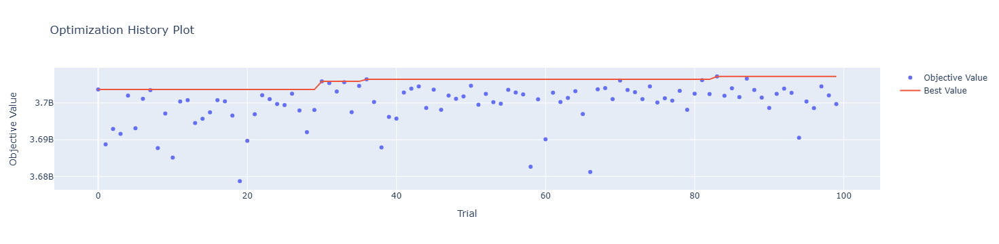

In [13]:
optuna.visualization.plot_optimization_history(study)

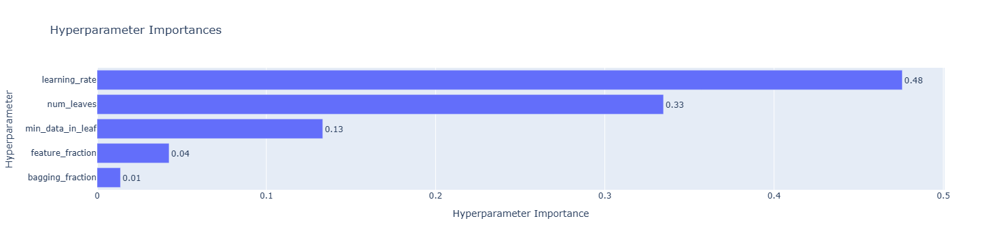

In [14]:
plot_param_importances(study)

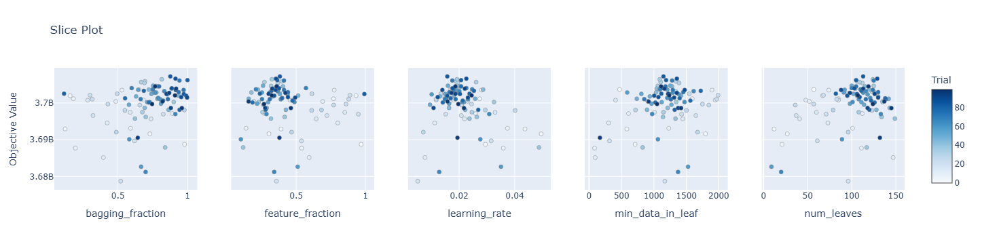

In [15]:
plot_slice(study)

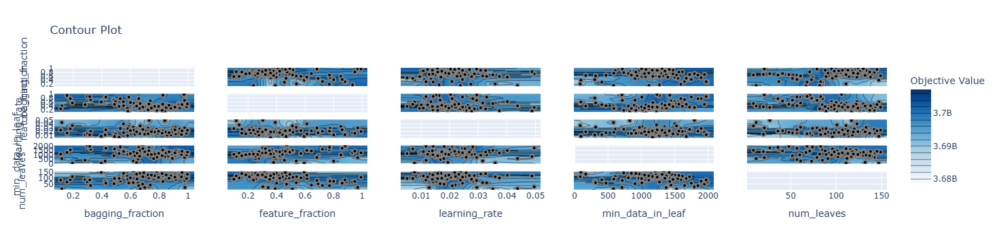

In [16]:
plot_contour(study)

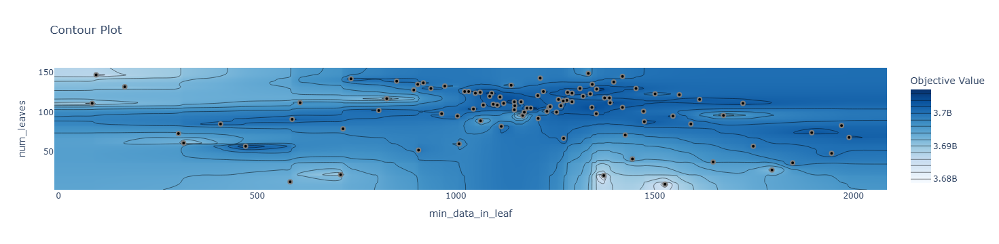

In [17]:
plot_contour(study, params=['num_leaves','min_data_in_leaf'])

In [18]:
study.best_trial.params

{'num_leaves': 113,
 'learning_rate': 0.015745941341634918,
 'min_data_in_leaf': 1147,
 'feature_fraction': 0.3823821572712469,
 'bagging_fraction': 0.87621599830048}

In [19]:
best_iter = study.best_trial.user_attrs["best_iter"]
best_iter

628